# 1. Data Preparation and Pre-processing

In [1]:
# Import necessary libraries

import os
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use("ggplot")
%matplotlib inline

from tqdm import tqdm_notebook, tnrange
from itertools import chain
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from sklearn.model_selection import train_test_split

import tensorflow as tf

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers import Lambda, RepeatVector, Reshape
from keras.layers import Conv2D, Conv2DTranspose
from keras.layers import MaxPooling2D, GlobalMaxPool2D
from keras.layers import concatenate, add
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam, SGD
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

from PIL import Image

2024-02-23 13:22:42.710360: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### # Location where the orginal image and the corresponding ground truth image are stored

In [2]:
image_path = 'train/image'
mask_path = 'train/label'

In [3]:
# list of number of images in the given path
ids = next(os.walk(image_path))[2]
print("No. of images = ", len(ids))

No. of images =  30


In [4]:
# Get the image names in the train/image folder
print(ids)

['8.jpg', '28.jpg', '29.jpg', '15.jpg', '17.jpg', '16.jpg', '13.jpg', '39.jpg', '11.jpg', '38.jpg', '21.jpg', '35.jpg', '20.jpg', '22.jpg', '23.jpg', '27.jpg', '26.jpg', '32.jpg', '24.jpg', '30.jpg', '31.jpg', '19.jpg', '5.jpg', '43.jpg', '7.jpg', '41.jpg', '44.jpg', '45.jpg', '47.jpg', '46.jpg']


In [5]:
# Mask images are images with the same file name but png as extension.
# Fetch mask ids by replacing jpg with png

# Create a new list to store mask ids
mask_ids = []

# Replace substring 'jpg' with 'png' for each id
for id in ids:
    mask_id = id.replace('jpg', 'png')
    mask_ids.append(mask_id)

# Print the modified list of ids
print(mask_ids)


['8.png', '28.png', '29.png', '15.png', '17.png', '16.png', '13.png', '39.png', '11.png', '38.png', '21.png', '35.png', '20.png', '22.png', '23.png', '27.png', '26.png', '32.png', '24.png', '30.png', '31.png', '19.png', '5.png', '43.png', '7.png', '41.png', '44.png', '45.png', '47.png', '46.png']


### # Overlay the ground truth image over the original image for visual verification of spatial alignment

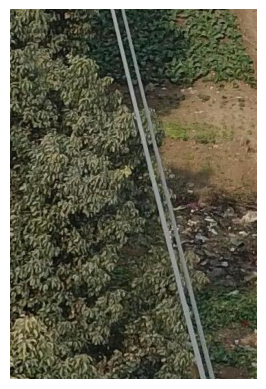

In [6]:
# Display one original image
image1 = Image.open(image_path+"/5.jpg")
plt.imshow(image1)
plt.axis('off')  # Turn off axis labels
plt.show()

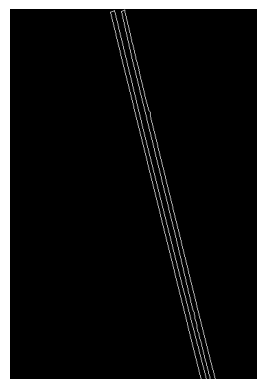

In [7]:
# Display the corresponding ground truth image
mask1 = Image.open(mask_path+"/5.png")
plt.imshow(mask1)
plt.axis('off')  # Turn off axis labels
plt.show()

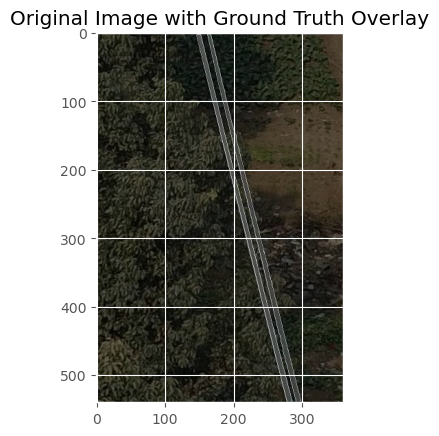

In [8]:
# Overlay both the images
def overlay_images(original_image, ground_truth_image):
    # Create a new figure and axes
    fig, ax = plt.subplots()

    # Plot the original image
    ax.imshow(original_image, cmap='gray')

    # Overlay the ground truth image with transparency
    ax.imshow(ground_truth_image, cmap='jet', alpha=0.5)

    # Set title and show plot
    ax.set_title('Original Image with Ground Truth Overlay')
    plt.show()

overlay_images(image1, mask1)

#### Observation:
From the overlay, we can verify that the ground truth image is spatially aligned with the original image.

### # Convert into grayscale and resize to 128 * 128 pixel images

In [9]:
# Set some parameters
# resize to 128 * 128 pixel images
im_width = 128
im_height = 128
border = 5

X = np.zeros((len(ids), im_height, im_width, 1), dtype=np.float32)
y = np.zeros((len(ids), im_height, im_width, 1), dtype=np.float32)

In [10]:
# tqdm is used to display the progress bar
# Convert to grayscale and resize to 128 * 128 pixel images

for n, id_ in tqdm_notebook(enumerate(ids), total=len(ids)):
    # Load images
    img = load_img(image_path+'/'+id_, grayscale=True)
    x_img = img_to_array(img)
    x_img = resize(x_img, (128, 128, 1), mode = 'constant', preserve_range = True)
    # Load masks
    mask = img_to_array(load_img(mask_path+"/"+ mask_ids[n], grayscale=True))
    mask = resize(mask, (128, 128, 1), mode = 'constant', preserve_range = True)
    # Save images
    X[n] = x_img/255.0
    y[n] = mask/255.0

/var/folders/4s/jwcqmfxx0sn21fklt1l7kj0c0000gn/T/ipykernel_18561/3111378267.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for n, id_ in tqdm_notebook(enumerate(ids), total=len(ids)):


  0%|          | 0/30 [00:00<?, ?it/s]

/Applications/anaconda3/lib/python3.10/site-packages/keras/src/utils/image_utils.py:409: UserWarning: grayscale is deprecated. Please use color_mode = "grayscale"
  warnings.warn(


# 2. Model Building and Training
### # 90/10 Train-Test Split

In [11]:
# Split train and valid
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.1, random_state=42)

In [12]:
print(X_train.shape)

(27, 128, 128, 1)


In [13]:
print(y_valid.shape)

(3, 128, 128, 1)


### # Load original image with annotated image

Text(0.5, 1.0, 'Powerline')

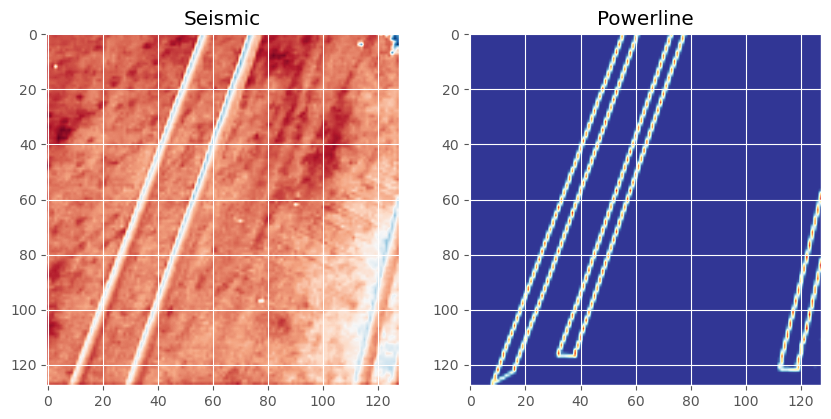

In [14]:
# Visualize any random image along with the mask
ix = random.randint(0, len(X_train))
has_mask = y_train[ix].max() > 0 # powerline indicator

fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 8))
# RdYlBu_r
ax1.imshow(X_train[ix, ..., 0], cmap = 'RdBu', interpolation = 'bilinear')
if has_mask: # if powerline present
    # draw a boundary(contour) in the original image separating powerline areas
    ax1.contour(y_train[ix].squeeze(), colors = 'k', linewidths = 5, levels = [0.5])
ax1.set_title('Seismic')
#'gray'
#'Greens'
ax2.imshow(y_train[ix].squeeze(), cmap = 'RdYlBu_r', interpolation = 'bilinear')
ax2.set_title('Powerline')

### # Build a UNET model for semantic segmentation

In [15]:
def conv2d_block(input_tensor, n_filters, kernel_size = 3, batchnorm = True):
    """Function to add 2 convolutional layers with the parameters passed to it"""
    # first layer
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # second layer
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)

    return x

In [16]:
def get_unet(input_img, n_filters = 16, dropout = 0.1, batchnorm = True):
    """Function to define the UNET Model"""
    # Contracting Path
    c1 = conv2d_block(input_img, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)
    p1 = MaxPooling2D((2, 2))(c1)
    p1 = Dropout(dropout)(p1)

    c2 = conv2d_block(p1, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)
    p2 = MaxPooling2D((2, 2))(c2)
    p2 = Dropout(dropout)(p2)

    c3 = conv2d_block(p2, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)
    p3 = MaxPooling2D((2, 2))(c3)
    p3 = Dropout(dropout)(p3)

    c4 = conv2d_block(p3, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    p4 = MaxPooling2D((2, 2))(c4)
    p4 = Dropout(dropout)(p4)

    c5 = conv2d_block(p4, n_filters = n_filters * 16, kernel_size = 3, batchnorm = batchnorm)

    # Expansive Path
    u6 = Conv2DTranspose(n_filters * 8, (3, 3), strides = (2, 2), padding = 'same')(c5)
    u6 = concatenate([u6, c4])
    u6 = Dropout(dropout)(u6)
    c6 = conv2d_block(u6, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)

    u7 = Conv2DTranspose(n_filters * 4, (3, 3), strides = (2, 2), padding = 'same')(c6)
    u7 = concatenate([u7, c3])
    u7 = Dropout(dropout)(u7)
    c7 = conv2d_block(u7, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)

    u8 = Conv2DTranspose(n_filters * 2, (3, 3), strides = (2, 2), padding = 'same')(c7)
    u8 = concatenate([u8, c2])
    u8 = Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)

    u9 = Conv2DTranspose(n_filters * 1, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = concatenate([u9, c1])
    u9 = Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)
    model = Model(inputs=[input_img], outputs=[outputs])
    return model

### # Compile model
#### Using Adam optimizer, binary crossentropy and accuracy as metric.

In [17]:
input_img = Input((im_height, im_width, 1), name='img')
model = get_unet(input_img, n_filters=16, dropout=0.05, batchnorm=True)
model.compile(optimizer=Adam(), loss="binary_crossentropy", metrics=["accuracy"])

In [18]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 img (InputLayer)            [(None, 128, 128, 1)]        0         []                            
                                                                                                  
 conv2d_1 (Conv2D)           (None, 128, 128, 16)         160       ['img[0][0]']                 
                                                                                                  
 batch_normalization_1 (Bat  (None, 128, 128, 16)         64        ['conv2d_1[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 activation_1 (Activation)   (None, 128, 128, 16)         0         ['batch_normalization_1[0]

                                                                                                  
 concatenate_1 (Concatenate  (None, 32, 32, 128)          0         ['conv2d_transpose_1[0][0]',  
 )                                                                   'activation_5[0][0]']        
                                                                                                  
 dropout_5 (Dropout)         (None, 32, 32, 128)          0         ['concatenate_1[0][0]']       
                                                                                                  
 conv2d_13 (Conv2D)          (None, 32, 32, 64)           73792     ['dropout_5[0][0]']           
                                                                                                  
 batch_normalization_13 (Ba  (None, 32, 32, 64)           256       ['conv2d_13[0][0]']           
 tchNormalization)                                                                                
          

In [25]:
callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('model-powerline.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

### # Train the model 
#### Batch size = 10, Epochs = 1000

In [26]:
results = model.fit(X_train, y_train, batch_size=10, epochs=1000, callbacks=callbacks,                    
                    validation_data=(X_valid, y_valid))

Epoch 1/1000
3/3 [==============================] - ETA: 0s - loss: 0.5531 - accuracy: 0.7229
Epoch 1: val_loss improved from inf to 0.65185, saving model to model-powerline.h5
3/3 [==============================] - 1s 359ms/step - loss: 0.5531 - accuracy: 0.7229 - val_loss: 0.6518 - val_accuracy: 0.7990 - lr: 1.0000e-05
Epoch 2/1000
3/3 [==============================] - ETA: 0s - loss: 0.5524 - accuracy: 0.7242
Epoch 2: val_loss improved from 0.65185 to 0.64809, saving model to model-powerline.h5
3/3 [==============================] - 1s 363ms/step - loss: 0.5524 - accuracy: 0.7242 - val_loss: 0.6481 - val_accuracy: 0.8495 - lr: 1.0000e-05
Epoch 3/1000
3/3 [==============================] - ETA: 0s - loss: 0.5525 - accuracy: 0.7247
Epoch 3: val_loss improved from 0.64809 to 0.64201, saving model to model-powerline.h5
3/3 [==============================] - 1s 364ms/step - loss: 0.5525 - accuracy: 0.7247 - val_loss: 0.6420 - val_accuracy: 0.8738 - lr: 1.0000e-05
Epoch 4/1000
3/3 [=====

Epoch 26/1000
3/3 [==============================] - ETA: 0s - loss: 0.5380 - accuracy: 0.7455
Epoch 26: val_loss improved from 0.52357 to 0.52041, saving model to model-powerline.h5
3/3 [==============================] - 1s 359ms/step - loss: 0.5380 - accuracy: 0.7455 - val_loss: 0.5204 - val_accuracy: 0.9199 - lr: 1.0000e-05
Epoch 27/1000
3/3 [==============================] - ETA: 0s - loss: 0.5375 - accuracy: 0.7471
Epoch 27: val_loss improved from 0.52041 to 0.51740, saving model to model-powerline.h5
3/3 [==============================] - 1s 367ms/step - loss: 0.5375 - accuracy: 0.7471 - val_loss: 0.5174 - val_accuracy: 0.9200 - lr: 1.0000e-05
Epoch 28/1000
3/3 [==============================] - ETA: 0s - loss: 0.5368 - accuracy: 0.7490
Epoch 28: val_loss improved from 0.51740 to 0.51440, saving model to model-powerline.h5
3/3 [==============================] - 1s 376ms/step - loss: 0.5368 - accuracy: 0.7490 - val_loss: 0.5144 - val_accuracy: 0.9200 - lr: 1.0000e-05
Epoch 29/1000

Epoch 51/1000
3/3 [==============================] - ETA: 0s - loss: 0.5207 - accuracy: 0.7714
Epoch 51: val_loss improved from 0.47205 to 0.47099, saving model to model-powerline.h5
3/3 [==============================] - 1s 412ms/step - loss: 0.5207 - accuracy: 0.7714 - val_loss: 0.4710 - val_accuracy: 0.9193 - lr: 1.0000e-05
Epoch 52/1000
3/3 [==============================] - ETA: 0s - loss: 0.5203 - accuracy: 0.7720
Epoch 52: val_loss improved from 0.47099 to 0.46998, saving model to model-powerline.h5
3/3 [==============================] - 1s 413ms/step - loss: 0.5203 - accuracy: 0.7720 - val_loss: 0.4700 - val_accuracy: 0.9191 - lr: 1.0000e-05
Epoch 53/1000
3/3 [==============================] - ETA: 0s - loss: 0.5200 - accuracy: 0.7731
Epoch 53: val_loss improved from 0.46998 to 0.46895, saving model to model-powerline.h5
3/3 [==============================] - 1s 413ms/step - loss: 0.5200 - accuracy: 0.7731 - val_loss: 0.4690 - val_accuracy: 0.9191 - lr: 1.0000e-05
Epoch 54/1000

Epoch 76/1000
3/3 [==============================] - ETA: 0s - loss: 0.5032 - accuracy: 0.7943
Epoch 76: val_loss improved from 0.45722 to 0.45702, saving model to model-powerline.h5
3/3 [==============================] - 1s 440ms/step - loss: 0.5032 - accuracy: 0.7943 - val_loss: 0.4570 - val_accuracy: 0.9153 - lr: 1.0000e-05
Epoch 77/1000
3/3 [==============================] - ETA: 0s - loss: 0.5036 - accuracy: 0.7949
Epoch 77: val_loss improved from 0.45702 to 0.45688, saving model to model-powerline.h5
3/3 [==============================] - 1s 433ms/step - loss: 0.5036 - accuracy: 0.7949 - val_loss: 0.4569 - val_accuracy: 0.9148 - lr: 1.0000e-05
Epoch 78/1000
3/3 [==============================] - ETA: 0s - loss: 0.5018 - accuracy: 0.7958
Epoch 78: val_loss improved from 0.45688 to 0.45675, saving model to model-powerline.h5
3/3 [==============================] - 1s 410ms/step - loss: 0.5018 - accuracy: 0.7958 - val_loss: 0.4567 - val_accuracy: 0.9146 - lr: 1.0000e-05
Epoch 79/1000

Epoch 101/1000
3/3 [==============================] - ETA: 0s - loss: 0.4849 - accuracy: 0.8152
Epoch 101: val_loss improved from 0.45404 to 0.45379, saving model to model-powerline.h5
3/3 [==============================] - 1s 389ms/step - loss: 0.4849 - accuracy: 0.8152 - val_loss: 0.4538 - val_accuracy: 0.9089 - lr: 1.0000e-05
Epoch 102/1000
3/3 [==============================] - ETA: 0s - loss: 0.4842 - accuracy: 0.8137
Epoch 102: val_loss improved from 0.45379 to 0.45359, saving model to model-powerline.h5
3/3 [==============================] - 1s 421ms/step - loss: 0.4842 - accuracy: 0.8137 - val_loss: 0.4536 - val_accuracy: 0.9090 - lr: 1.0000e-05
Epoch 103/1000
3/3 [==============================] - ETA: 0s - loss: 0.4839 - accuracy: 0.8146
Epoch 103: val_loss improved from 0.45359 to 0.45342, saving model to model-powerline.h5
3/3 [==============================] - 1s 415ms/step - loss: 0.4839 - accuracy: 0.8146 - val_loss: 0.4534 - val_accuracy: 0.9089 - lr: 1.0000e-05
Epoch 1

Epoch 126/1000
3/3 [==============================] - ETA: 0s - loss: 0.4653 - accuracy: 0.8320
Epoch 126: val_loss improved from 0.44881 to 0.44848, saving model to model-powerline.h5
3/3 [==============================] - 1s 447ms/step - loss: 0.4653 - accuracy: 0.8320 - val_loss: 0.4485 - val_accuracy: 0.9073 - lr: 1.0000e-05
Epoch 127/1000
3/3 [==============================] - ETA: 0s - loss: 0.4647 - accuracy: 0.8317
Epoch 127: val_loss improved from 0.44848 to 0.44809, saving model to model-powerline.h5
3/3 [==============================] - 1s 435ms/step - loss: 0.4647 - accuracy: 0.8317 - val_loss: 0.4481 - val_accuracy: 0.9073 - lr: 1.0000e-05
Epoch 128/1000
3/3 [==============================] - ETA: 0s - loss: 0.4640 - accuracy: 0.8322
Epoch 128: val_loss improved from 0.44809 to 0.44770, saving model to model-powerline.h5
3/3 [==============================] - 1s 420ms/step - loss: 0.4640 - accuracy: 0.8322 - val_loss: 0.4477 - val_accuracy: 0.9073 - lr: 1.0000e-05
Epoch 1

Epoch 151/1000
3/3 [==============================] - ETA: 0s - loss: 0.4482 - accuracy: 0.8424
Epoch 151: val_loss improved from 0.43225 to 0.43152, saving model to model-powerline.h5
3/3 [==============================] - 1s 440ms/step - loss: 0.4482 - accuracy: 0.8424 - val_loss: 0.4315 - val_accuracy: 0.9091 - lr: 1.0000e-05
Epoch 152/1000
3/3 [==============================] - ETA: 0s - loss: 0.4471 - accuracy: 0.8432
Epoch 152: val_loss improved from 0.43152 to 0.43054, saving model to model-powerline.h5
3/3 [==============================] - 1s 435ms/step - loss: 0.4471 - accuracy: 0.8432 - val_loss: 0.4305 - val_accuracy: 0.9091 - lr: 1.0000e-05
Epoch 153/1000
3/3 [==============================] - ETA: 0s - loss: 0.4459 - accuracy: 0.8444
Epoch 153: val_loss improved from 0.43054 to 0.42962, saving model to model-powerline.h5
3/3 [==============================] - 1s 444ms/step - loss: 0.4459 - accuracy: 0.8444 - val_loss: 0.4296 - val_accuracy: 0.9092 - lr: 1.0000e-05
Epoch 1

Epoch 176/1000
3/3 [==============================] - ETA: 0s - loss: 0.4314 - accuracy: 0.8528
Epoch 176: val_loss improved from 0.41633 to 0.41551, saving model to model-powerline.h5
3/3 [==============================] - 1s 433ms/step - loss: 0.4314 - accuracy: 0.8528 - val_loss: 0.4155 - val_accuracy: 0.9119 - lr: 1.0000e-05
Epoch 177/1000
3/3 [==============================] - ETA: 0s - loss: 0.4331 - accuracy: 0.8510
Epoch 177: val_loss improved from 0.41551 to 0.41477, saving model to model-powerline.h5
3/3 [==============================] - 1s 436ms/step - loss: 0.4331 - accuracy: 0.8510 - val_loss: 0.4148 - val_accuracy: 0.9119 - lr: 1.0000e-05
Epoch 178/1000
3/3 [==============================] - ETA: 0s - loss: 0.4321 - accuracy: 0.8517
Epoch 178: val_loss improved from 0.41477 to 0.41404, saving model to model-powerline.h5
3/3 [==============================] - 1s 428ms/step - loss: 0.4321 - accuracy: 0.8517 - val_loss: 0.4140 - val_accuracy: 0.9120 - lr: 1.0000e-05
Epoch 1

Epoch 201/1000
3/3 [==============================] - ETA: 0s - loss: 0.4161 - accuracy: 0.8597
Epoch 201: val_loss improved from 0.40053 to 0.39995, saving model to model-powerline.h5
3/3 [==============================] - 1s 465ms/step - loss: 0.4161 - accuracy: 0.8597 - val_loss: 0.4000 - val_accuracy: 0.9145 - lr: 1.0000e-05
Epoch 202/1000
3/3 [==============================] - ETA: 0s - loss: 0.4171 - accuracy: 0.8577
Epoch 202: val_loss improved from 0.39995 to 0.39943, saving model to model-powerline.h5
3/3 [==============================] - 1s 424ms/step - loss: 0.4171 - accuracy: 0.8577 - val_loss: 0.3994 - val_accuracy: 0.9146 - lr: 1.0000e-05
Epoch 203/1000
3/3 [==============================] - ETA: 0s - loss: 0.4152 - accuracy: 0.8596
Epoch 203: val_loss improved from 0.39943 to 0.39878, saving model to model-powerline.h5
3/3 [==============================] - 1s 430ms/step - loss: 0.4152 - accuracy: 0.8596 - val_loss: 0.3988 - val_accuracy: 0.9147 - lr: 1.0000e-05
Epoch 2

Epoch 226/1000
3/3 [==============================] - ETA: 0s - loss: 0.4059 - accuracy: 0.8621
Epoch 226: val_loss improved from 0.38495 to 0.38442, saving model to model-powerline.h5
3/3 [==============================] - 1s 446ms/step - loss: 0.4059 - accuracy: 0.8621 - val_loss: 0.3844 - val_accuracy: 0.9172 - lr: 1.0000e-05
Epoch 227/1000
3/3 [==============================] - ETA: 0s - loss: 0.4060 - accuracy: 0.8620
Epoch 227: val_loss improved from 0.38442 to 0.38376, saving model to model-powerline.h5
3/3 [==============================] - 1s 426ms/step - loss: 0.4060 - accuracy: 0.8620 - val_loss: 0.3838 - val_accuracy: 0.9172 - lr: 1.0000e-05
Epoch 228/1000
3/3 [==============================] - ETA: 0s - loss: 0.4036 - accuracy: 0.8634
Epoch 228: val_loss improved from 0.38376 to 0.38322, saving model to model-powerline.h5
3/3 [==============================] - 1s 422ms/step - loss: 0.4036 - accuracy: 0.8634 - val_loss: 0.3832 - val_accuracy: 0.9173 - lr: 1.0000e-05
Epoch 2

Epoch 251/1000
3/3 [==============================] - ETA: 0s - loss: 0.3936 - accuracy: 0.8653
Epoch 251: val_loss improved from 0.37086 to 0.37038, saving model to model-powerline.h5
3/3 [==============================] - 1s 498ms/step - loss: 0.3936 - accuracy: 0.8653 - val_loss: 0.3704 - val_accuracy: 0.9191 - lr: 1.0000e-05
Epoch 252/1000
3/3 [==============================] - ETA: 0s - loss: 0.3930 - accuracy: 0.8661
Epoch 252: val_loss improved from 0.37038 to 0.36992, saving model to model-powerline.h5
3/3 [==============================] - 1s 471ms/step - loss: 0.3930 - accuracy: 0.8661 - val_loss: 0.3699 - val_accuracy: 0.9191 - lr: 1.0000e-05
Epoch 253/1000
3/3 [==============================] - ETA: 0s - loss: 0.3919 - accuracy: 0.8659
Epoch 253: val_loss improved from 0.36992 to 0.36945, saving model to model-powerline.h5
3/3 [==============================] - 1s 480ms/step - loss: 0.3919 - accuracy: 0.8659 - val_loss: 0.3694 - val_accuracy: 0.9192 - lr: 1.0000e-05
Epoch 2

Epoch 276/1000
3/3 [==============================] - ETA: 0s - loss: 0.3831 - accuracy: 0.8684
Epoch 276: val_loss improved from 0.35642 to 0.35588, saving model to model-powerline.h5
3/3 [==============================] - 1s 484ms/step - loss: 0.3831 - accuracy: 0.8684 - val_loss: 0.3559 - val_accuracy: 0.9203 - lr: 1.0000e-05
Epoch 277/1000
3/3 [==============================] - ETA: 0s - loss: 0.3812 - accuracy: 0.8683
Epoch 277: val_loss improved from 0.35588 to 0.35540, saving model to model-powerline.h5
3/3 [==============================] - 1s 506ms/step - loss: 0.3812 - accuracy: 0.8683 - val_loss: 0.3554 - val_accuracy: 0.9203 - lr: 1.0000e-05
Epoch 278/1000
3/3 [==============================] - ETA: 0s - loss: 0.3853 - accuracy: 0.8664
Epoch 278: val_loss improved from 0.35540 to 0.35500, saving model to model-powerline.h5
3/3 [==============================] - 1s 493ms/step - loss: 0.3853 - accuracy: 0.8664 - val_loss: 0.3550 - val_accuracy: 0.9203 - lr: 1.0000e-05
Epoch 2

3/3 [==============================] - 1s 509ms/step - loss: 0.3719 - accuracy: 0.8701 - val_loss: 0.3460 - val_accuracy: 0.9208 - lr: 1.0000e-05
Epoch 302/1000
3/3 [==============================] - ETA: 0s - loss: 0.3731 - accuracy: 0.8695
Epoch 302: val_loss improved from 0.34602 to 0.34569, saving model to model-powerline.h5
3/3 [==============================] - 1s 493ms/step - loss: 0.3731 - accuracy: 0.8695 - val_loss: 0.3457 - val_accuracy: 0.9208 - lr: 1.0000e-05
Epoch 303/1000
3/3 [==============================] - ETA: 0s - loss: 0.3727 - accuracy: 0.8699
Epoch 303: val_loss improved from 0.34569 to 0.34543, saving model to model-powerline.h5
3/3 [==============================] - 1s 520ms/step - loss: 0.3727 - accuracy: 0.8699 - val_loss: 0.3454 - val_accuracy: 0.9208 - lr: 1.0000e-05
Epoch 304/1000
3/3 [==============================] - ETA: 0s - loss: 0.3731 - accuracy: 0.8695
Epoch 304: val_loss improved from 0.34543 to 0.34510, saving model to model-powerline.h5
3/3 [==

3/3 [==============================] - 1s 435ms/step - loss: 0.3674 - accuracy: 0.8694 - val_loss: 0.3369 - val_accuracy: 0.9211 - lr: 1.0000e-05
Epoch 327/1000
3/3 [==============================] - ETA: 0s - loss: 0.3671 - accuracy: 0.8694
Epoch 327: val_loss did not improve from 0.33692
3/3 [==============================] - 1s 396ms/step - loss: 0.3671 - accuracy: 0.8694 - val_loss: 0.3372 - val_accuracy: 0.9210 - lr: 1.0000e-05
Epoch 328/1000
3/3 [==============================] - ETA: 0s - loss: 0.3736 - accuracy: 0.8672
Epoch 328: val_loss did not improve from 0.33692
3/3 [==============================] - 1s 372ms/step - loss: 0.3736 - accuracy: 0.8672 - val_loss: 0.3385 - val_accuracy: 0.9202 - lr: 1.0000e-05
Epoch 329/1000
3/3 [==============================] - ETA: 0s - loss: 0.3633 - accuracy: 0.8708
Epoch 329: val_loss did not improve from 0.33692
3/3 [==============================] - 1s 394ms/step - loss: 0.3633 - accuracy: 0.8708 - val_loss: 0.3417 - val_accuracy: 0.918

Epoch 354/1000
3/3 [==============================] - ETA: 0s - loss: 0.3600 - accuracy: 0.8696
Epoch 354: val_loss did not improve from 0.33220
3/3 [==============================] - 2s 496ms/step - loss: 0.3600 - accuracy: 0.8696 - val_loss: 0.3330 - val_accuracy: 0.9199 - lr: 1.0000e-05
Epoch 354: early stopping


### # Plot Loss Vs Epoch curve for training and validation data

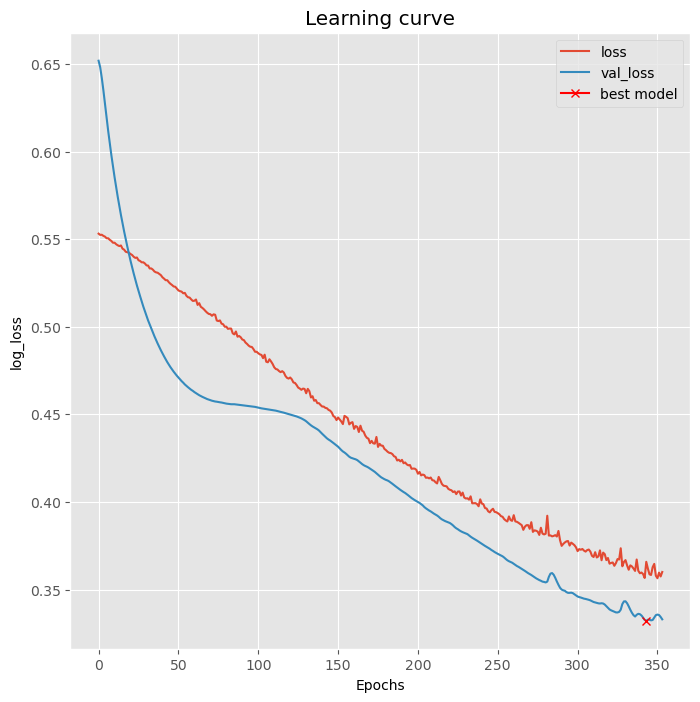

In [27]:
plt.figure(figsize=(8, 8))
plt.title("Learning curve")
plt.plot(results.history["loss"], label="loss")
plt.plot(results.history["val_loss"], label="val_loss")
plt.plot( np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("log_loss")
plt.legend();

### # Plot Accuracy Vs Epoch curve for training and validation data

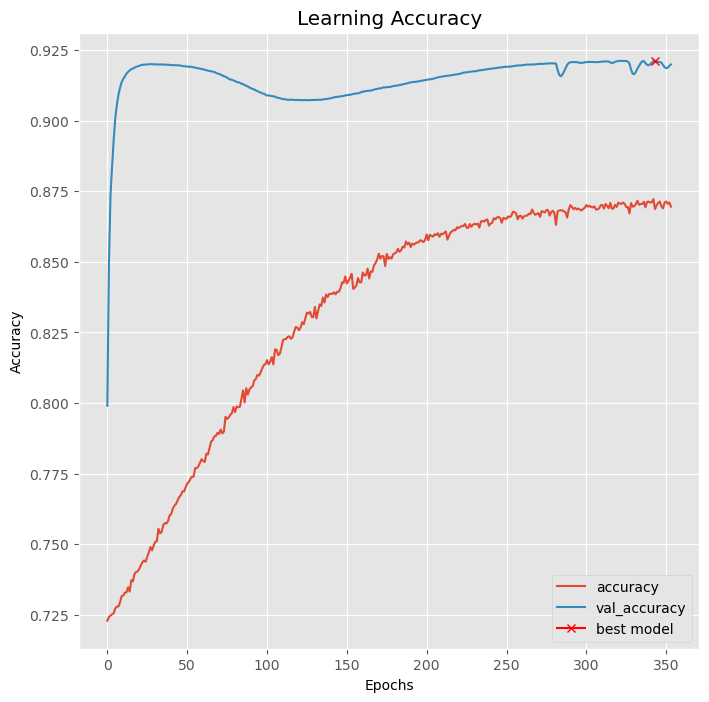

In [28]:
plt.figure(figsize=(8, 8))
plt.title("Learning Accuracy")
plt.plot(results.history["accuracy"], label="accuracy")
plt.plot(results.history["val_accuracy"], label="val_accuracy")
plt.plot( np.argmax(results.history["val_accuracy"]), np.max(results.history["val_accuracy"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend();

### # Evaluate the best model

In [29]:
# load the best model
model.load_weights('model-powerline.h5')

In [30]:
# Evaluate on validation set (this must be equals to the best log_loss)
model.evaluate(X_valid, y_valid, verbose=1)

1/1 [==============================] - 0s 94ms/step - loss: 0.3322 - accuracy: 0.9213


[0.3321998119354248, 0.9212646484375]

### # Predict on training and validation data

In [31]:
# Predict on train, val data
preds_train = model.predict(X_train, verbose=1)
preds_val = model.predict(X_valid, verbose=1)

1/1 [==============================] - 0s 82ms/step


### # Binary thresholding at 0.5

In [32]:
# Threshold predictions at 0.5
preds_train_t = (preds_train > 0.5).astype(np.uint8)
preds_val_t = (preds_val > 0.5).astype(np.uint8)

# 3. Result Visualization

In [39]:
y[3]

array([[[0.0000000e+00],
        [0.0000000e+00],
        [0.0000000e+00],
        ...,
        [0.0000000e+00],
        [0.0000000e+00],
        [0.0000000e+00]],

       [[0.0000000e+00],
        [0.0000000e+00],
        [0.0000000e+00],
        ...,
        [0.0000000e+00],
        [0.0000000e+00],
        [0.0000000e+00]],

       [[0.0000000e+00],
        [0.0000000e+00],
        [4.5530766e-09],
        ...,
        [0.0000000e+00],
        [0.0000000e+00],
        [0.0000000e+00]],

       ...,

       [[0.0000000e+00],
        [0.0000000e+00],
        [0.0000000e+00],
        ...,
        [6.3019764e-04],
        [0.0000000e+00],
        [0.0000000e+00]],

       [[0.0000000e+00],
        [0.0000000e+00],
        [0.0000000e+00],
        ...,
        [1.3371326e-05],
        [0.0000000e+00],
        [0.0000000e+00]],

       [[0.0000000e+00],
        [0.0000000e+00],
        [0.0000000e+00],
        ...,
        [1.9933646e-09],
        [0.0000000e+00],
        [0.0000000e+00]]

In [73]:
def plot_sample(X, y, preds, binary_preds, ix=None):
   # """Function to plot the results"""
    if ix is None:
        ix = random.randint(0, len(X))

    has_mask = y[ix].max() > 0

    fig, ax = plt.subplots(1, 4, figsize=(20, 10))
    ax[0].imshow(X[ix, ..., 0], cmap='RdBu')
    if has_mask:
        ax[0].contour(y[ix].squeeze(), colors='k', levels=[0.2,0.5])
    ax[0].set_title('gray')

    ax[1].imshow(y[ix].squeeze())
    ax[1].set_title('Powerline')

    ax[2].imshow(preds[ix].squeeze(), vmin=0, vmax=1)
    if has_mask:
        ax[2].contour(y[ix].squeeze(), colors='k', levels=[0.2,0.5])
    ax[2].set_title('Powerline Predicted')

    ax[3].imshow(binary_preds[ix].squeeze(), vmin=0, vmax=1)
    if has_mask:
        ax[3].contour(y[ix].squeeze(), colors='k', levels=[0.2,0.5])
    ax[3].set_title('Powerline Predicted binary');



### # Display image comparison for random samples

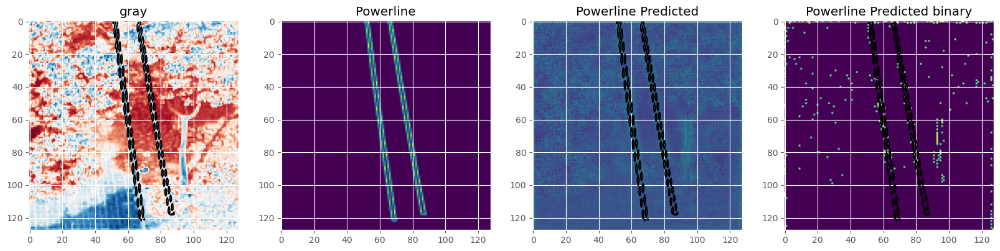

In [74]:
# Check if training data looks all right
plot_sample(X_train, y_train, preds_train, preds_train_t, ix=3)

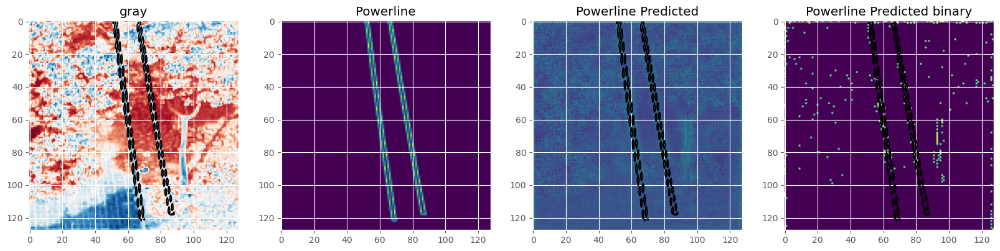

In [75]:
# Check if training data looks all right
plot_sample(X_train, y_train, preds_train, preds_train_t)

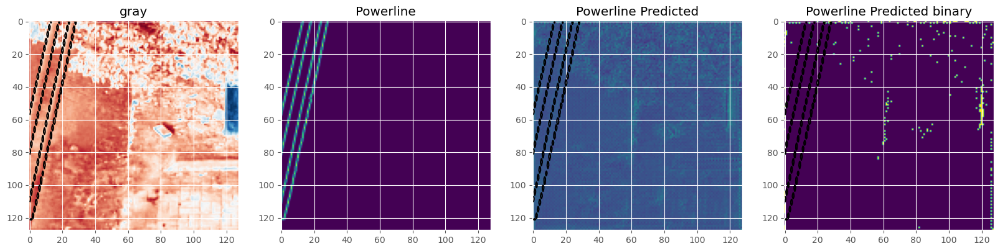

In [76]:
# Check if valid data looks all right
plot_sample(X_valid, y_valid, preds_val, preds_val_t, ix=1)

### # Threshold predictions at 0.4 with visualization

In [77]:
# Threshold predictions at 0.4
preds_train_t = (preds_train > 0.4).astype(np.uint8)
preds_val_t = (preds_val > 0.4).astype(np.uint8)

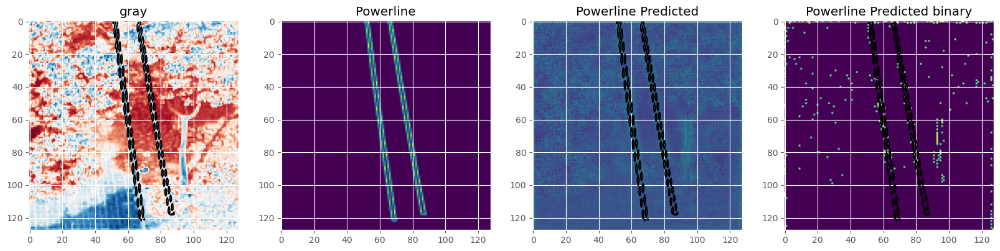

In [78]:
# Check if training data looks all right
plot_sample(X_train, y_train, preds_train, preds_train_t, ix=3)

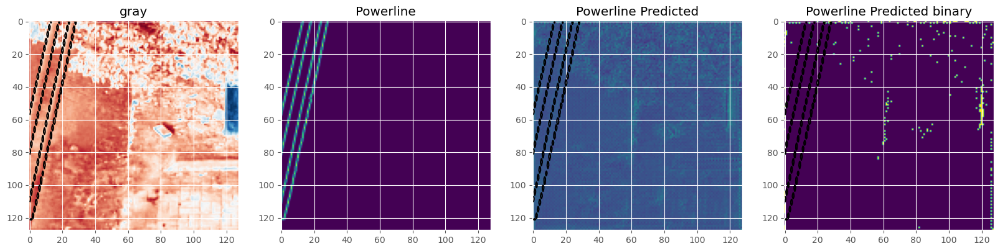

In [79]:
# Check if valid data looks all right
plot_sample(X_valid, y_valid, preds_val, preds_val_t, ix=1)

### # Threshold predictions at 0.7 with visualization

In [80]:
# Threshold predictions at 0.7
preds_train_t = (preds_train > 0.7).astype(np.uint8)
preds_val_t = (preds_val > 0.7).astype(np.uint8)

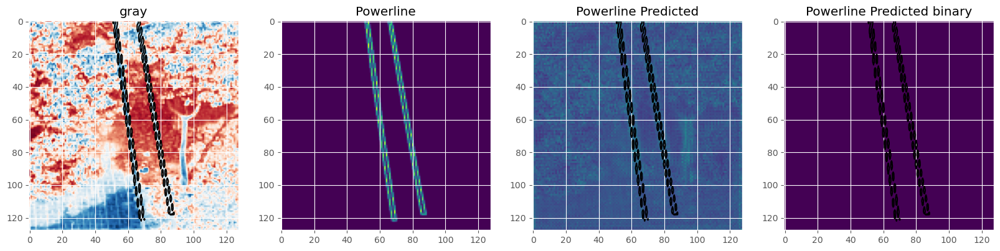

In [81]:
# Check if training data looks all right
plot_sample(X_train, y_train, preds_train, preds_train_t, ix=3)

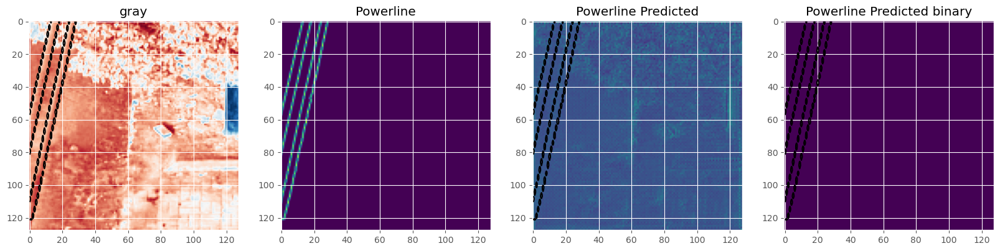

In [82]:
# Check if valid data looks all right
plot_sample(X_valid, y_valid, preds_val, preds_val_t, ix=1)

# 4. Experiments

### 1. Change the optimizer learning rate of the Adam optimizer to 1e-4

#### # Compile the model

In [83]:
model_1 = get_unet(input_img, n_filters=16, dropout=0.05, batchnorm=True)
model_1.compile(optimizer=Adam(learning_rate=1e-4), loss="binary_crossentropy", metrics=["accuracy"])

model_1.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 img (InputLayer)            [(None, 128, 128, 1)]        0         []                            
                                                                                                  
 conv2d_39 (Conv2D)          (None, 128, 128, 16)         160       ['img[0][0]']                 
                                                                                                  
 batch_normalization_37 (Ba  (None, 128, 128, 16)         64        ['conv2d_39[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_37 (Activation)  (None, 128, 128, 16)         0         ['batch_normalization_37

                                                                                                  
 concatenate_9 (Concatenate  (None, 32, 32, 128)          0         ['conv2d_transpose_9[0][0]',  
 )                                                                   'activation_41[0][0]']       
                                                                                                  
 dropout_21 (Dropout)        (None, 32, 32, 128)          0         ['concatenate_9[0][0]']       
                                                                                                  
 conv2d_51 (Conv2D)          (None, 32, 32, 64)           73792     ['dropout_21[0][0]']          
                                                                                                  
 batch_normalization_49 (Ba  (None, 32, 32, 64)           256       ['conv2d_51[0][0]']           
 tchNormalization)                                                                                
          

#### # Fit the model

In [84]:
callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('model_1-powerline.h5', verbose=1, save_best_only=True, save_weights_only=True)
]
results = model_1.fit(X_train, y_train, batch_size=10, epochs=1000, callbacks=callbacks,
                    validation_data=(X_valid, y_valid))

Epoch 1/1000
3/3 [==============================] - ETA: 0s - loss: 0.9598 - accuracy: 0.2558
Epoch 1: val_loss improved from inf to 0.68771, saving model to model_1-powerline.h5
3/3 [==============================] - 4s 563ms/step - loss: 0.9598 - accuracy: 0.2558 - val_loss: 0.6877 - val_accuracy: 0.5329 - lr: 1.0000e-04
Epoch 2/1000
3/3 [==============================] - ETA: 0s - loss: 0.9511 - accuracy: 0.2607
Epoch 2: val_loss did not improve from 0.68771
3/3 [==============================] - 1s 409ms/step - loss: 0.9511 - accuracy: 0.2607 - val_loss: 0.6937 - val_accuracy: 0.4848 - lr: 1.0000e-04
Epoch 3/1000
3/3 [==============================] - ETA: 0s - loss: 0.9437 - accuracy: 0.2599
Epoch 3: val_loss did not improve from 0.68771
3/3 [==============================] - 1s 395ms/step - loss: 0.9437 - accuracy: 0.2599 - val_loss: 0.6978 - val_accuracy: 0.4418 - lr: 1.0000e-04
Epoch 4/1000
3/3 [==============================] - ETA: 0s - loss: 0.9360 - accuracy: 0.2646
Epoch 4

#### # Plot Loss Vs Epoch curve for training and validation data

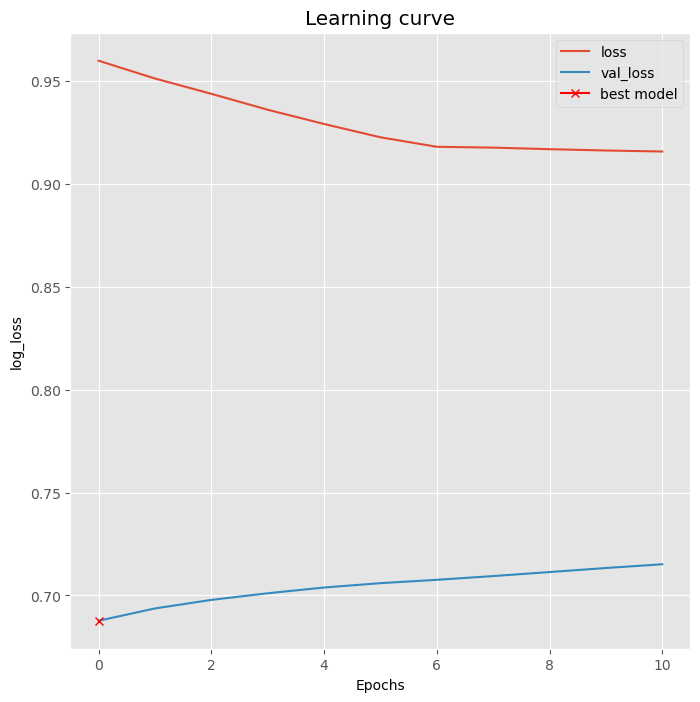

In [85]:
plt.figure(figsize=(8, 8))
plt.title("Learning curve")
plt.plot(results.history["loss"], label="loss")
plt.plot(results.history["val_loss"], label="val_loss")
plt.plot( np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("log_loss")
plt.legend();

#### # Plot Accuracy Vs Epoch curve for training and validation data

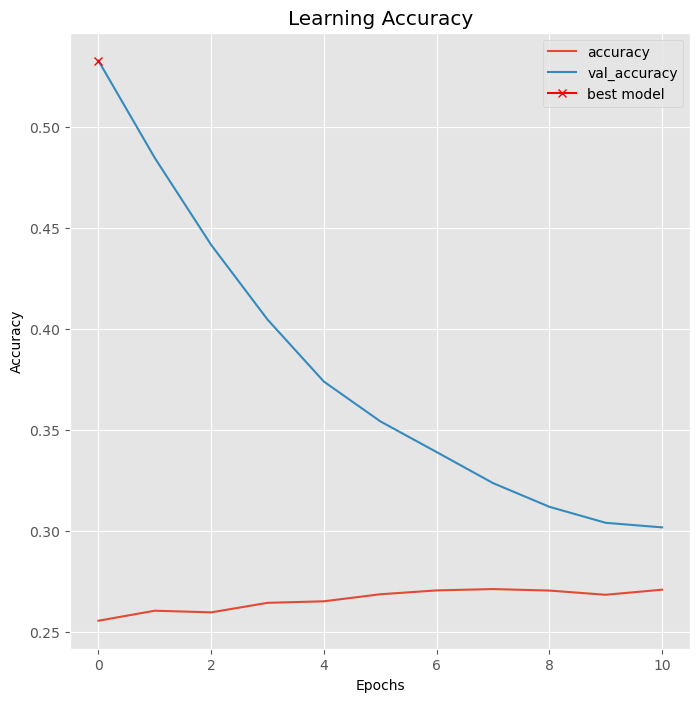

In [86]:
plt.figure(figsize=(8, 8))
plt.title("Learning Accuracy")
plt.plot(results.history["accuracy"], label="accuracy")
plt.plot(results.history["val_accuracy"], label="val_accuracy")
plt.plot( np.argmax(results.history["val_accuracy"]), np.max(results.history["val_accuracy"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend();

#### # Evaluate model and perform predictions at threshold = 0.5, visualize predictions

In [87]:
# load the best model
model_1.load_weights('model_1-powerline.h5')
# Evaluate on validation set (this must be equals to the best log_loss)
model_1.evaluate(X_valid, y_valid, verbose=1)
# Predict on train, val and test
preds_train = model_1.predict(X_train, verbose=1)
preds_val = model_1.predict(X_valid, verbose=1)
# Threshold predictions
preds_train_t = (preds_train > 0.5).astype(np.uint8)
preds_val_t = (preds_val > 0.5).astype(np.uint8)

1/1 [==============================] - 0s 65ms/step


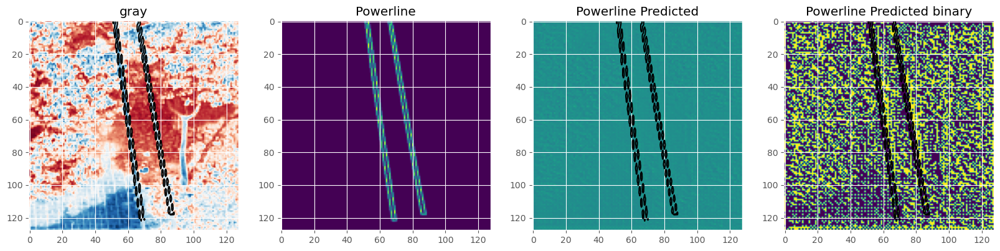

In [88]:
# Check if training data looks all right
plot_sample(X_train, y_train, preds_train, preds_train_t, ix=3)

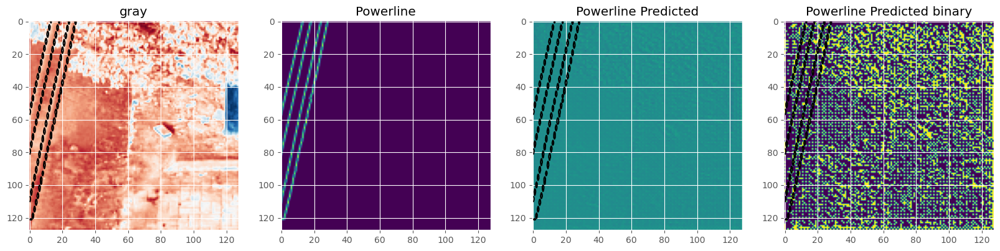

In [89]:
# Check if valid data looks all right
plot_sample(X_valid, y_valid, preds_val, preds_val_t, ix=1)

#### # Threshold predictions at 0.4 with visualization

In [90]:
# Threshold predictions
preds_train_t = (preds_train > 0.4).astype(np.uint8)
preds_val_t = (preds_val > 0.4).astype(np.uint8)

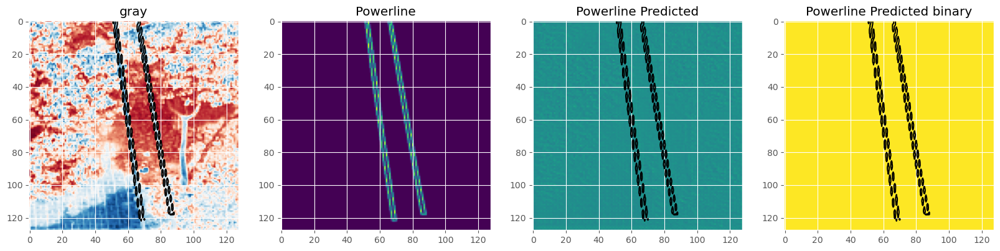

In [91]:
# Check if training data looks all right
plot_sample(X_train, y_train, preds_train, preds_train_t, ix=3)

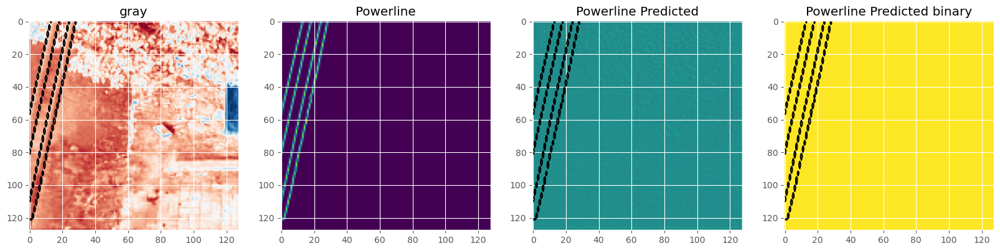

In [92]:
# Check if valid data looks all right
plot_sample(X_valid, y_valid, preds_val, preds_val_t, ix=1)

#### Threshold predictions at 0.7 with visualization

In [93]:
# Threshold predictions
preds_train_t = (preds_train > 0.7).astype(np.uint8)
preds_val_t = (preds_val > 0.7).astype(np.uint8)

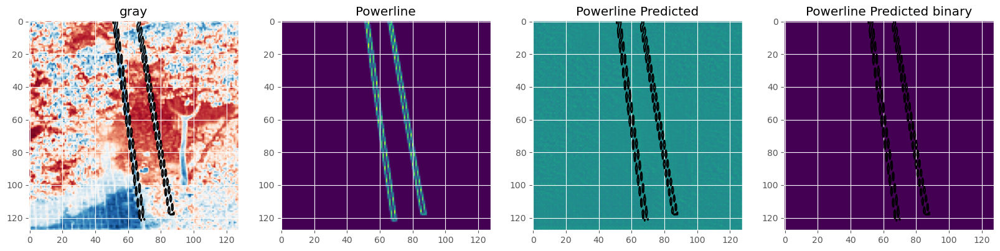

In [94]:
# Check if training data looks all right
plot_sample(X_train, y_train, preds_train, preds_train_t, ix=3)

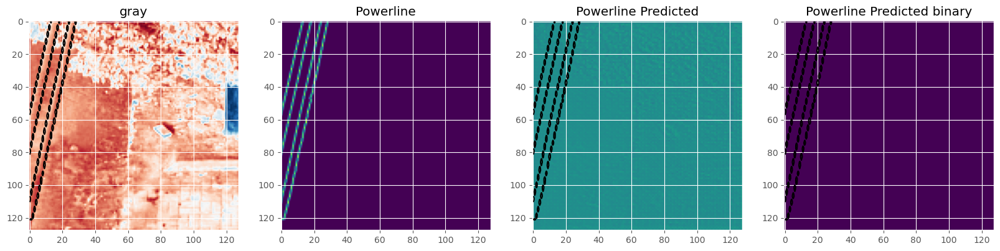

In [95]:
# Check if valid data looks all right
plot_sample(X_valid, y_valid, preds_val, preds_val_t, ix=1)

### 2. Change the optimizer to SGD
#### # Compile the model

In [96]:
model_2 = get_unet(input_img, n_filters=16, dropout=0.05, batchnorm=True)
model_2.compile(optimizer=SGD(), loss="binary_crossentropy", metrics=["accuracy"])

model_2.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 img (InputLayer)            [(None, 128, 128, 1)]        0         []                            
                                                                                                  
 conv2d_58 (Conv2D)          (None, 128, 128, 16)         160       ['img[0][0]']                 
                                                                                                  
 batch_normalization_55 (Ba  (None, 128, 128, 16)         64        ['conv2d_58[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_55 (Activation)  (None, 128, 128, 16)         0         ['batch_normalization_55

                                                                                                  
 concatenate_13 (Concatenat  (None, 32, 32, 128)          0         ['conv2d_transpose_13[0][0]', 
 e)                                                                  'activation_59[0][0]']       
                                                                                                  
 dropout_29 (Dropout)        (None, 32, 32, 128)          0         ['concatenate_13[0][0]']      
                                                                                                  
 conv2d_70 (Conv2D)          (None, 32, 32, 64)           73792     ['dropout_29[0][0]']          
                                                                                                  
 batch_normalization_67 (Ba  (None, 32, 32, 64)           256       ['conv2d_70[0][0]']           
 tchNormalization)                                                                                
          

#### # Fit the model

In [97]:
callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('model_2-powerline.h5', verbose=1, save_best_only=True, save_weights_only=True)
]
results = model_2.fit(X_train, y_train, batch_size=10, epochs=1000, callbacks=callbacks,\
                    validation_data=(X_valid, y_valid))


Epoch 1/1000
3/3 [==============================] - ETA: 0s - loss: 0.3543 - accuracy: 0.8433
Epoch 1: val_loss improved from inf to 0.60611, saving model to model_2-powerline.h5
3/3 [==============================] - 3s 541ms/step - loss: 0.3543 - accuracy: 0.8433 - val_loss: 0.6061 - val_accuracy: 0.8973 - lr: 0.0100
Epoch 2/1000
3/3 [==============================] - ETA: 0s - loss: 0.3463 - accuracy: 0.8482
Epoch 2: val_loss improved from 0.60611 to 0.60580, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 457ms/step - loss: 0.3463 - accuracy: 0.8482 - val_loss: 0.6058 - val_accuracy: 0.9049 - lr: 0.0100
Epoch 3/1000
3/3 [==============================] - ETA: 0s - loss: 0.3380 - accuracy: 0.8539
Epoch 3: val_loss improved from 0.60580 to 0.60477, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 426ms/step - loss: 0.3380 - accuracy: 0.8539 - val_loss: 0.6048 - val_accuracy: 0.9109 - lr: 0.0100
Epoch 4/1000
3/3 [===========

3/3 [==============================] - ETA: 0s - loss: 0.1640 - accuracy: 0.8773
Epoch 51: val_loss improved from 0.28593 to 0.28026, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 446ms/step - loss: 0.1640 - accuracy: 0.8773 - val_loss: 0.2803 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 52/1000
3/3 [==============================] - ETA: 0s - loss: 0.1624 - accuracy: 0.8773
Epoch 52: val_loss improved from 0.28026 to 0.27468, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 466ms/step - loss: 0.1624 - accuracy: 0.8773 - val_loss: 0.2747 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 53/1000
3/3 [==============================] - ETA: 0s - loss: 0.1616 - accuracy: 0.8773
Epoch 53: val_loss improved from 0.27468 to 0.26927, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 455ms/step - loss: 0.1616 - accuracy: 0.8773 - val_loss: 0.2693 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 54/1000
3/3 [==============

3/3 [==============================] - ETA: 0s - loss: 0.1148 - accuracy: 0.8773
Epoch 101: val_loss improved from 0.13258 to 0.13123, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 455ms/step - loss: 0.1148 - accuracy: 0.8773 - val_loss: 0.1312 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 102/1000
3/3 [==============================] - ETA: 0s - loss: 0.1143 - accuracy: 0.8773
Epoch 102: val_loss improved from 0.13123 to 0.12991, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 439ms/step - loss: 0.1143 - accuracy: 0.8773 - val_loss: 0.1299 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 103/1000
3/3 [==============================] - ETA: 0s - loss: 0.1138 - accuracy: 0.8773
Epoch 103: val_loss improved from 0.12991 to 0.12860, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 458ms/step - loss: 0.1138 - accuracy: 0.8773 - val_loss: 0.1286 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 104/1000
3/3 [========

Epoch 126/1000
3/3 [==============================] - ETA: 0s - loss: 0.1030 - accuracy: 0.8773
Epoch 126: val_loss improved from 0.10657 to 0.10579, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 452ms/step - loss: 0.1030 - accuracy: 0.8773 - val_loss: 0.1058 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 127/1000
3/3 [==============================] - ETA: 0s - loss: 0.1027 - accuracy: 0.8773
Epoch 127: val_loss improved from 0.10579 to 0.10511, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 469ms/step - loss: 0.1027 - accuracy: 0.8773 - val_loss: 0.1051 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 128/1000
3/3 [==============================] - ETA: 0s - loss: 0.1021 - accuracy: 0.8773
Epoch 128: val_loss improved from 0.10511 to 0.10437, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 496ms/step - loss: 0.1021 - accuracy: 0.8773 - val_loss: 0.1044 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 129/100

Epoch 151/1000
3/3 [==============================] - ETA: 0s - loss: 0.0946 - accuracy: 0.8773
Epoch 151: val_loss improved from 0.09148 to 0.09101, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 458ms/step - loss: 0.0946 - accuracy: 0.8773 - val_loss: 0.0910 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 152/1000
3/3 [==============================] - ETA: 0s - loss: 0.0944 - accuracy: 0.8773
Epoch 152: val_loss improved from 0.09101 to 0.09055, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 436ms/step - loss: 0.0944 - accuracy: 0.8773 - val_loss: 0.0905 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 153/1000
3/3 [==============================] - ETA: 0s - loss: 0.0941 - accuracy: 0.8773
Epoch 153: val_loss improved from 0.09055 to 0.09009, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 471ms/step - loss: 0.0941 - accuracy: 0.8773 - val_loss: 0.0901 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 154/100

Epoch 176/1000
3/3 [==============================] - ETA: 0s - loss: 0.0887 - accuracy: 0.8773
Epoch 176: val_loss improved from 0.08154 to 0.08122, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 419ms/step - loss: 0.0887 - accuracy: 0.8773 - val_loss: 0.0812 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 177/1000
3/3 [==============================] - ETA: 0s - loss: 0.0885 - accuracy: 0.8773
Epoch 177: val_loss improved from 0.08122 to 0.08091, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 387ms/step - loss: 0.0885 - accuracy: 0.8773 - val_loss: 0.0809 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 178/1000
3/3 [==============================] - ETA: 0s - loss: 0.0882 - accuracy: 0.8773
Epoch 178: val_loss improved from 0.08091 to 0.08059, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 408ms/step - loss: 0.0882 - accuracy: 0.8773 - val_loss: 0.0806 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 179/100

Epoch 201/1000
3/3 [==============================] - ETA: 0s - loss: 0.0842 - accuracy: 0.8773
Epoch 201: val_loss improved from 0.07497 to 0.07473, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 458ms/step - loss: 0.0842 - accuracy: 0.8773 - val_loss: 0.0747 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 202/1000
3/3 [==============================] - ETA: 0s - loss: 0.0840 - accuracy: 0.8773
Epoch 202: val_loss improved from 0.07473 to 0.07450, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 471ms/step - loss: 0.0840 - accuracy: 0.8773 - val_loss: 0.0745 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 203/1000
3/3 [==============================] - ETA: 0s - loss: 0.0840 - accuracy: 0.8773
Epoch 203: val_loss improved from 0.07450 to 0.07429, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 463ms/step - loss: 0.0840 - accuracy: 0.8773 - val_loss: 0.0743 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 204/100

Epoch 226/1000
3/3 [==============================] - ETA: 0s - loss: 0.0806 - accuracy: 0.8773
Epoch 226: val_loss improved from 0.07001 to 0.06984, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 430ms/step - loss: 0.0806 - accuracy: 0.8773 - val_loss: 0.0698 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 227/1000
3/3 [==============================] - ETA: 0s - loss: 0.0807 - accuracy: 0.8773
Epoch 227: val_loss improved from 0.06984 to 0.06969, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 457ms/step - loss: 0.0807 - accuracy: 0.8773 - val_loss: 0.0697 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 228/1000
3/3 [==============================] - ETA: 0s - loss: 0.0804 - accuracy: 0.8773
Epoch 228: val_loss improved from 0.06969 to 0.06952, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 432ms/step - loss: 0.0804 - accuracy: 0.8773 - val_loss: 0.0695 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 229/100

Epoch 251/1000
3/3 [==============================] - ETA: 0s - loss: 0.0781 - accuracy: 0.8773
Epoch 251: val_loss improved from 0.06630 to 0.06616, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 388ms/step - loss: 0.0781 - accuracy: 0.8773 - val_loss: 0.0662 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 252/1000
3/3 [==============================] - ETA: 0s - loss: 0.0779 - accuracy: 0.8773
Epoch 252: val_loss improved from 0.06616 to 0.06605, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 397ms/step - loss: 0.0779 - accuracy: 0.8773 - val_loss: 0.0660 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 253/1000
3/3 [==============================] - ETA: 0s - loss: 0.0777 - accuracy: 0.8773
Epoch 253: val_loss improved from 0.06605 to 0.06591, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 394ms/step - loss: 0.0777 - accuracy: 0.8773 - val_loss: 0.0659 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 254/100

Epoch 276/1000
3/3 [==============================] - ETA: 0s - loss: 0.0759 - accuracy: 0.8773
Epoch 276: val_loss improved from 0.06344 to 0.06334, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 454ms/step - loss: 0.0759 - accuracy: 0.8773 - val_loss: 0.0633 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 277/1000
3/3 [==============================] - ETA: 0s - loss: 0.0758 - accuracy: 0.8773
Epoch 277: val_loss improved from 0.06334 to 0.06324, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 430ms/step - loss: 0.0758 - accuracy: 0.8773 - val_loss: 0.0632 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 278/1000
3/3 [==============================] - ETA: 0s - loss: 0.0757 - accuracy: 0.8773
Epoch 278: val_loss improved from 0.06324 to 0.06316, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 405ms/step - loss: 0.0757 - accuracy: 0.8773 - val_loss: 0.0632 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 279/100

Epoch 301/1000
3/3 [==============================] - ETA: 0s - loss: 0.0740 - accuracy: 0.8773
Epoch 301: val_loss improved from 0.06113 to 0.06105, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 434ms/step - loss: 0.0740 - accuracy: 0.8773 - val_loss: 0.0611 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 302/1000
3/3 [==============================] - ETA: 0s - loss: 0.0741 - accuracy: 0.8773
Epoch 302: val_loss improved from 0.06105 to 0.06095, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 400ms/step - loss: 0.0741 - accuracy: 0.8773 - val_loss: 0.0609 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 303/1000
3/3 [==============================] - ETA: 0s - loss: 0.0742 - accuracy: 0.8773
Epoch 303: val_loss improved from 0.06095 to 0.06090, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 411ms/step - loss: 0.0742 - accuracy: 0.8773 - val_loss: 0.0609 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 304/100

Epoch 326/1000
3/3 [==============================] - ETA: 0s - loss: 0.0725 - accuracy: 0.8773
Epoch 326: val_loss improved from 0.05925 to 0.05918, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 451ms/step - loss: 0.0725 - accuracy: 0.8773 - val_loss: 0.0592 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 327/1000
3/3 [==============================] - ETA: 0s - loss: 0.0725 - accuracy: 0.8773
Epoch 327: val_loss improved from 0.05918 to 0.05911, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 461ms/step - loss: 0.0725 - accuracy: 0.8773 - val_loss: 0.0591 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 328/1000
3/3 [==============================] - ETA: 0s - loss: 0.0723 - accuracy: 0.8773
Epoch 328: val_loss improved from 0.05911 to 0.05905, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 443ms/step - loss: 0.0723 - accuracy: 0.8773 - val_loss: 0.0591 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 329/100

Epoch 351/1000
3/3 [==============================] - ETA: 0s - loss: 0.0712 - accuracy: 0.8773
Epoch 351: val_loss improved from 0.05765 to 0.05759, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 418ms/step - loss: 0.0712 - accuracy: 0.8773 - val_loss: 0.0576 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 352/1000
3/3 [==============================] - ETA: 0s - loss: 0.0712 - accuracy: 0.8773
Epoch 352: val_loss improved from 0.05759 to 0.05754, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 439ms/step - loss: 0.0712 - accuracy: 0.8773 - val_loss: 0.0575 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 353/1000
3/3 [==============================] - ETA: 0s - loss: 0.0711 - accuracy: 0.8773
Epoch 353: val_loss improved from 0.05754 to 0.05747, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 408ms/step - loss: 0.0711 - accuracy: 0.8773 - val_loss: 0.0575 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 354/100

Epoch 376/1000
3/3 [==============================] - ETA: 0s - loss: 0.0701 - accuracy: 0.8773
Epoch 376: val_loss improved from 0.05631 to 0.05626, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 398ms/step - loss: 0.0701 - accuracy: 0.8773 - val_loss: 0.0563 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 377/1000
3/3 [==============================] - ETA: 0s - loss: 0.0701 - accuracy: 0.8773
Epoch 377: val_loss improved from 0.05626 to 0.05621, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 390ms/step - loss: 0.0701 - accuracy: 0.8773 - val_loss: 0.0562 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 378/1000
3/3 [==============================] - ETA: 0s - loss: 0.0701 - accuracy: 0.8773
Epoch 378: val_loss improved from 0.05621 to 0.05617, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 367ms/step - loss: 0.0701 - accuracy: 0.8773 - val_loss: 0.0562 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 379/100

Epoch 401/1000
3/3 [==============================] - ETA: 0s - loss: 0.0693 - accuracy: 0.8773
Epoch 401: val_loss improved from 0.05517 to 0.05512, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 397ms/step - loss: 0.0693 - accuracy: 0.8773 - val_loss: 0.0551 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 402/1000
3/3 [==============================] - ETA: 0s - loss: 0.0691 - accuracy: 0.8773
Epoch 402: val_loss improved from 0.05512 to 0.05507, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 474ms/step - loss: 0.0691 - accuracy: 0.8773 - val_loss: 0.0551 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 403/1000
3/3 [==============================] - ETA: 0s - loss: 0.0691 - accuracy: 0.8773
Epoch 403: val_loss improved from 0.05507 to 0.05502, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 462ms/step - loss: 0.0691 - accuracy: 0.8773 - val_loss: 0.0550 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 404/100

Epoch 426/1000
3/3 [==============================] - ETA: 0s - loss: 0.0684 - accuracy: 0.8773
Epoch 426: val_loss improved from 0.05414 to 0.05410, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 412ms/step - loss: 0.0684 - accuracy: 0.8773 - val_loss: 0.0541 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 427/1000
3/3 [==============================] - ETA: 0s - loss: 0.0683 - accuracy: 0.8773
Epoch 427: val_loss improved from 0.05410 to 0.05409, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 411ms/step - loss: 0.0683 - accuracy: 0.8773 - val_loss: 0.0541 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 428/1000
3/3 [==============================] - ETA: 0s - loss: 0.0684 - accuracy: 0.8773
Epoch 428: val_loss improved from 0.05409 to 0.05404, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 422ms/step - loss: 0.0684 - accuracy: 0.8773 - val_loss: 0.0540 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 429/100

Epoch 451/1000
3/3 [==============================] - ETA: 0s - loss: 0.0675 - accuracy: 0.8773
Epoch 451: val_loss improved from 0.05328 to 0.05325, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 427ms/step - loss: 0.0675 - accuracy: 0.8773 - val_loss: 0.0532 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 452/1000
3/3 [==============================] - ETA: 0s - loss: 0.0677 - accuracy: 0.8773
Epoch 452: val_loss improved from 0.05325 to 0.05322, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 401ms/step - loss: 0.0677 - accuracy: 0.8773 - val_loss: 0.0532 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 453/1000
3/3 [==============================] - ETA: 0s - loss: 0.0677 - accuracy: 0.8773
Epoch 453: val_loss improved from 0.05322 to 0.05317, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 456ms/step - loss: 0.0677 - accuracy: 0.8773 - val_loss: 0.0532 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 454/100

Epoch 476/1000
3/3 [==============================] - ETA: 0s - loss: 0.0671 - accuracy: 0.8773
Epoch 476: val_loss improved from 0.05254 to 0.05250, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 418ms/step - loss: 0.0671 - accuracy: 0.8773 - val_loss: 0.0525 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 477/1000
3/3 [==============================] - ETA: 0s - loss: 0.0670 - accuracy: 0.8773
Epoch 477: val_loss improved from 0.05250 to 0.05247, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 452ms/step - loss: 0.0670 - accuracy: 0.8773 - val_loss: 0.0525 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 478/1000
3/3 [==============================] - ETA: 0s - loss: 0.0670 - accuracy: 0.8773
Epoch 478: val_loss improved from 0.05247 to 0.05245, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 474ms/step - loss: 0.0670 - accuracy: 0.8773 - val_loss: 0.0525 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 479/100

Epoch 501/1000
3/3 [==============================] - ETA: 0s - loss: 0.0663 - accuracy: 0.8773
Epoch 501: val_loss improved from 0.05188 to 0.05186, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 428ms/step - loss: 0.0663 - accuracy: 0.8773 - val_loss: 0.0519 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 502/1000
3/3 [==============================] - ETA: 0s - loss: 0.0664 - accuracy: 0.8773
Epoch 502: val_loss improved from 0.05186 to 0.05182, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 413ms/step - loss: 0.0664 - accuracy: 0.8773 - val_loss: 0.0518 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 503/1000
3/3 [==============================] - ETA: 0s - loss: 0.0666 - accuracy: 0.8773
Epoch 503: val_loss improved from 0.05182 to 0.05179, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 440ms/step - loss: 0.0666 - accuracy: 0.8773 - val_loss: 0.0518 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 504/100

Epoch 526/1000
3/3 [==============================] - ETA: 0s - loss: 0.0658 - accuracy: 0.8773
Epoch 526: val_loss improved from 0.05122 to 0.05120, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 419ms/step - loss: 0.0658 - accuracy: 0.8773 - val_loss: 0.0512 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 527/1000
3/3 [==============================] - ETA: 0s - loss: 0.0655 - accuracy: 0.8773
Epoch 527: val_loss improved from 0.05120 to 0.05118, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 485ms/step - loss: 0.0655 - accuracy: 0.8773 - val_loss: 0.0512 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 528/1000
3/3 [==============================] - ETA: 0s - loss: 0.0659 - accuracy: 0.8773
Epoch 528: val_loss improved from 0.05118 to 0.05115, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 447ms/step - loss: 0.0659 - accuracy: 0.8773 - val_loss: 0.0512 - val_accuracy: 0.9220 - lr: 0.0100
Epoch 529/100

Epoch 551/1000
3/3 [==============================] - ETA: 0s - loss: 0.0655 - accuracy: 0.8773
Epoch 551: val_loss improved from 0.05073 to 0.05072, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 416ms/step - loss: 0.0655 - accuracy: 0.8773 - val_loss: 0.0507 - val_accuracy: 0.9220 - lr: 1.0000e-03
Epoch 552/1000
3/3 [==============================] - ETA: 0s - loss: 0.0655 - accuracy: 0.8773
Epoch 552: val_loss improved from 0.05072 to 0.05071, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 423ms/step - loss: 0.0655 - accuracy: 0.8773 - val_loss: 0.0507 - val_accuracy: 0.9220 - lr: 1.0000e-03
Epoch 553/1000
3/3 [==============================] - ETA: 0s - loss: 0.0655 - accuracy: 0.8773
Epoch 553: ReduceLROnPlateau reducing learning rate to 9.999999310821295e-05.

Epoch 553: val_loss improved from 0.05071 to 0.05069, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 464ms/step - loss: 0.0655 

3/3 [==============================] - 1s 463ms/step - loss: 0.0654 - accuracy: 0.8773 - val_loss: 0.0505 - val_accuracy: 0.9220 - lr: 1.0000e-05
Epoch 576/1000
3/3 [==============================] - ETA: 0s - loss: 0.0655 - accuracy: 0.8773
Epoch 576: val_loss improved from 0.05054 to 0.05054, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 431ms/step - loss: 0.0655 - accuracy: 0.8773 - val_loss: 0.0505 - val_accuracy: 0.9220 - lr: 1.0000e-05
Epoch 577/1000
3/3 [==============================] - ETA: 0s - loss: 0.0653 - accuracy: 0.8773
Epoch 577: val_loss improved from 0.05054 to 0.05054, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 409ms/step - loss: 0.0653 - accuracy: 0.8773 - val_loss: 0.0505 - val_accuracy: 0.9220 - lr: 1.0000e-05
Epoch 578/1000
3/3 [==============================] - ETA: 0s - loss: 0.0654 - accuracy: 0.8773
Epoch 578: val_loss improved from 0.05054 to 0.05053, saving model to model_2-powerline.h5
3

Epoch 601/1000
3/3 [==============================] - ETA: 0s - loss: 0.0654 - accuracy: 0.8773
Epoch 601: val_loss did not improve from 0.05047
3/3 [==============================] - 1s 371ms/step - loss: 0.0654 - accuracy: 0.8773 - val_loss: 0.0505 - val_accuracy: 0.9220 - lr: 1.0000e-05
Epoch 602/1000
3/3 [==============================] - ETA: 0s - loss: 0.0655 - accuracy: 0.8773
Epoch 602: val_loss improved from 0.05047 to 0.05047, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 387ms/step - loss: 0.0655 - accuracy: 0.8773 - val_loss: 0.0505 - val_accuracy: 0.9220 - lr: 1.0000e-05
Epoch 603/1000
3/3 [==============================] - ETA: 0s - loss: 0.0654 - accuracy: 0.8773
Epoch 603: val_loss improved from 0.05047 to 0.05047, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 436ms/step - loss: 0.0654 - accuracy: 0.8773 - val_loss: 0.0505 - val_accuracy: 0.9220 - lr: 1.0000e-05
Epoch 604/1000
3/3 [=======================

Epoch 627/1000
3/3 [==============================] - ETA: 0s - loss: 0.0654 - accuracy: 0.8773
Epoch 627: val_loss improved from 0.05041 to 0.05041, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 397ms/step - loss: 0.0654 - accuracy: 0.8773 - val_loss: 0.0504 - val_accuracy: 0.9220 - lr: 1.0000e-05
Epoch 628/1000
3/3 [==============================] - ETA: 0s - loss: 0.0655 - accuracy: 0.8773
Epoch 628: val_loss improved from 0.05041 to 0.05040, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 420ms/step - loss: 0.0655 - accuracy: 0.8773 - val_loss: 0.0504 - val_accuracy: 0.9220 - lr: 1.0000e-05
Epoch 629/1000
3/3 [==============================] - ETA: 0s - loss: 0.0655 - accuracy: 0.8773
Epoch 629: val_loss improved from 0.05040 to 0.05040, saving model to model_2-powerline.h5
3/3 [==============================] - 1s 439ms/step - loss: 0.0655 - accuracy: 0.8773 - val_loss: 0.0504 - val_accuracy: 0.9220 - lr: 1.0000e-05
E

#### # Plot Loss Vs Epoch Curve for training and validation data

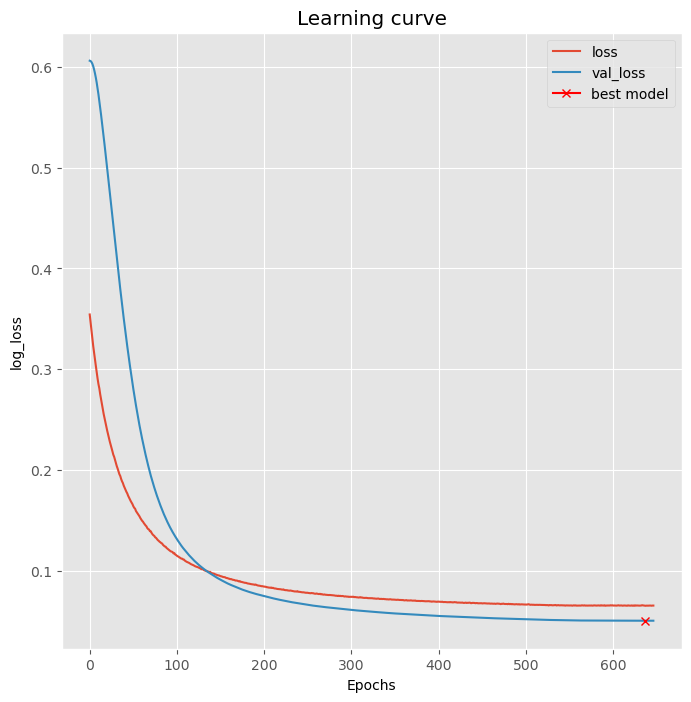

In [98]:
plt.figure(figsize=(8, 8))
plt.title("Learning curve")
plt.plot(results.history["loss"], label="loss")
plt.plot(results.history["val_loss"], label="val_loss")
plt.plot( np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("log_loss")
plt.legend();

#### # Plot Accuracy Vs Epoch curve for training and validation data

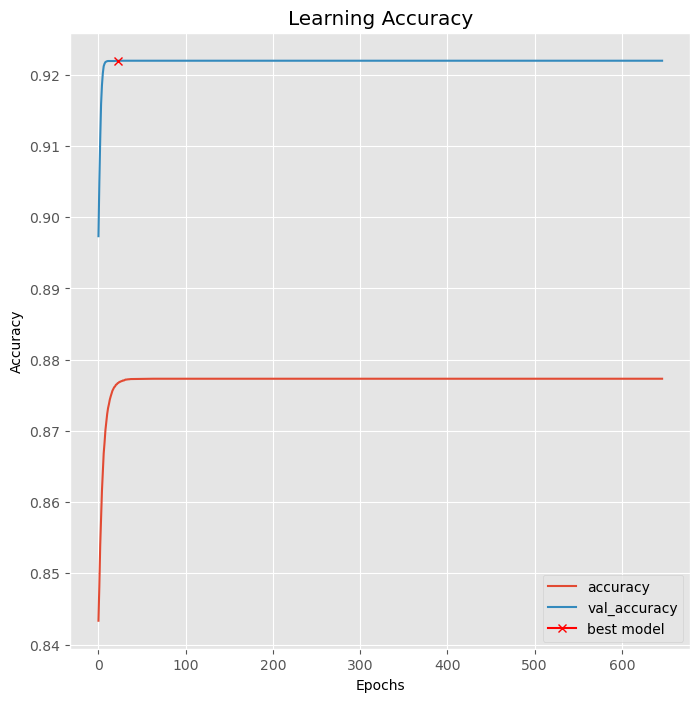

In [99]:
plt.figure(figsize=(8, 8))
plt.title("Learning Accuracy")
plt.plot(results.history["accuracy"], label="accuracy")
plt.plot(results.history["val_accuracy"], label="val_accuracy")
plt.plot( np.argmax(results.history["val_accuracy"]), np.max(results.history["val_accuracy"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend();

#### # Evaluate model and make predictions at threshold = 0.5 with visaulization

In [100]:
# load the best model
model_2.load_weights('model_2-powerline.h5')
# Evaluate on validation set (this must be equals to the best log_loss)
model_2.evaluate(X_valid, y_valid, verbose=1)
# Predict on train, val and test
preds_train = model_2.predict(X_train, verbose=1)
preds_val = model_2.predict(X_valid, verbose=1)
# Threshold predictions
preds_train_t = (preds_train > 0.5).astype(np.uint8)
preds_val_t = (preds_val > 0.5).astype(np.uint8)

1/1 [==============================] - 0s 68ms/step


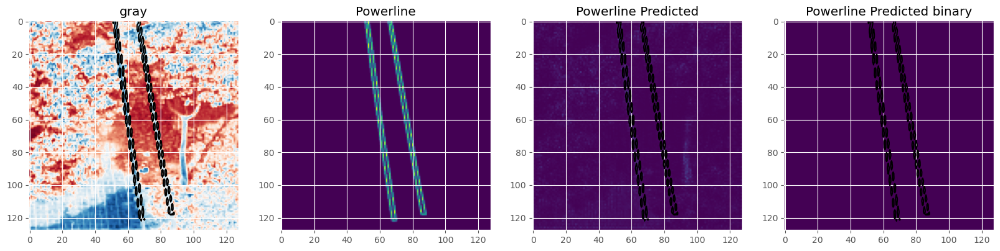

In [101]:
# Check if training data looks all right
plot_sample(X_train, y_train, preds_train, preds_train_t, ix=3)

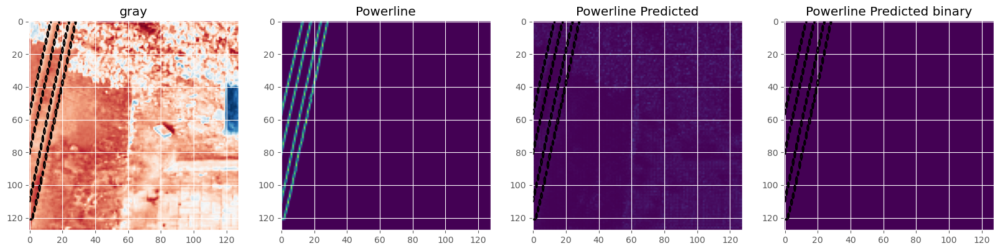

In [102]:
# Check if valid data looks all right
plot_sample(X_valid, y_valid, preds_val, preds_val_t, ix=1)

#### # Threshold predictions at 0.4 with visualization

In [103]:
# Threshold predictions
preds_train_t = (preds_train > 0.4).astype(np.uint8)
preds_val_t = (preds_val > 0.4).astype(np.uint8)

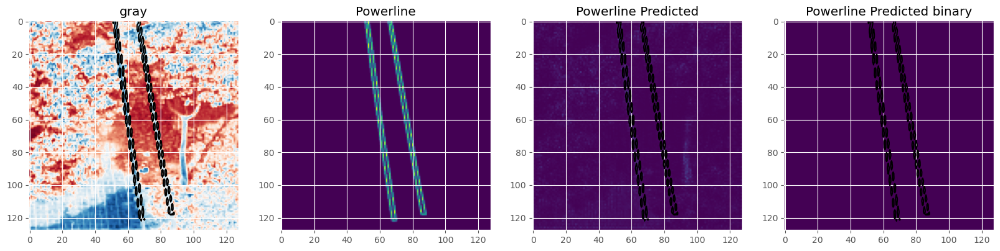

In [104]:
# Check if training data looks all right
plot_sample(X_train, y_train, preds_train, preds_train_t, ix=3)

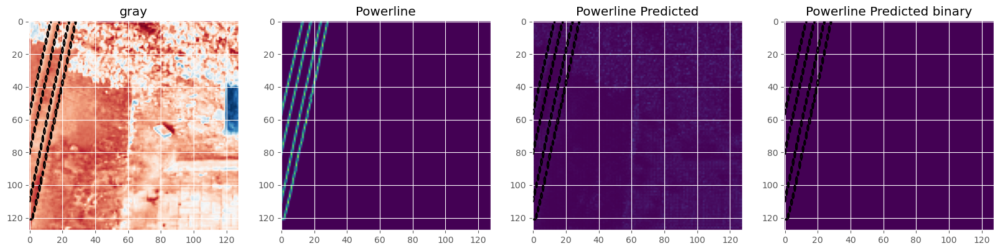

In [105]:
# Check if valid data looks all right
plot_sample(X_valid, y_valid, preds_val, preds_val_t, ix=1)

### # Threshold predictions at 0.7 with visualization

In [106]:
# Threshold predictions
preds_train_t = (preds_train > 0.7).astype(np.uint8)
preds_val_t = (preds_val > 0.7).astype(np.uint8)

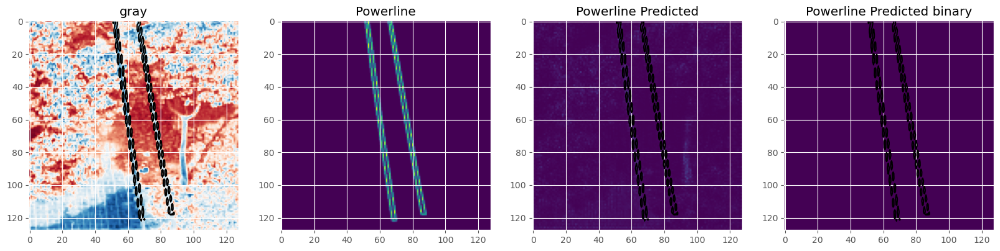

In [107]:
# Check if training data looks all right
plot_sample(X_train, y_train, preds_train, preds_train_t, ix=3)

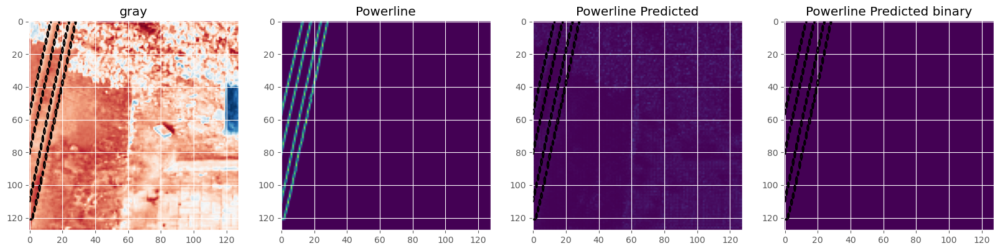

In [108]:
# Check if valid data looks all right
plot_sample(X_valid, y_valid, preds_val, preds_val_t, ix=1)

### 3. Train the model for 100 epochs
#### # Compile the model

In [109]:
model_3 = get_unet(input_img, n_filters=16, dropout=0.05, batchnorm=True)
model_3.compile(optimizer=Adam(), loss="binary_crossentropy", metrics=["accuracy"])

model_3.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 img (InputLayer)            [(None, 128, 128, 1)]        0         []                            
                                                                                                  
 conv2d_77 (Conv2D)          (None, 128, 128, 16)         160       ['img[0][0]']                 
                                                                                                  
 batch_normalization_73 (Ba  (None, 128, 128, 16)         64        ['conv2d_77[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_73 (Activation)  (None, 128, 128, 16)         0         ['batch_normalization_73

                                                                                                  
 concatenate_17 (Concatenat  (None, 32, 32, 128)          0         ['conv2d_transpose_17[0][0]', 
 e)                                                                  'activation_77[0][0]']       
                                                                                                  
 dropout_37 (Dropout)        (None, 32, 32, 128)          0         ['concatenate_17[0][0]']      
                                                                                                  
 conv2d_89 (Conv2D)          (None, 32, 32, 64)           73792     ['dropout_37[0][0]']          
                                                                                                  
 batch_normalization_85 (Ba  (None, 32, 32, 64)           256       ['conv2d_89[0][0]']           
 tchNormalization)                                                                                
          

#### # Fit the model

In [110]:
callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint('model_3-powerline.h5', verbose=1, save_best_only=True, save_weights_only=True)
]
results = model_3.fit(X_train, y_train, batch_size=10, epochs=100, callbacks=callbacks,
                    validation_data=(X_valid, y_valid))

Epoch 1/100
3/3 [==============================] - ETA: 0s - loss: 0.6839 - accuracy: 0.5124
Epoch 1: val_loss improved from inf to 0.70000, saving model to model_3-powerline.h5
3/3 [==============================] - 4s 602ms/step - loss: 0.6839 - accuracy: 0.5124 - val_loss: 0.7000 - val_accuracy: 0.4124 - lr: 0.0010
Epoch 2/100
3/3 [==============================] - ETA: 0s - loss: 0.6272 - accuracy: 0.6017
Epoch 2: val_loss did not improve from 0.70000
3/3 [==============================] - 1s 378ms/step - loss: 0.6272 - accuracy: 0.6017 - val_loss: 0.8315 - val_accuracy: 0.1687 - lr: 0.0010
Epoch 3/100
3/3 [==============================] - ETA: 0s - loss: 0.5833 - accuracy: 0.6711
Epoch 3: val_loss did not improve from 0.70000
3/3 [==============================] - 1s 370ms/step - loss: 0.5833 - accuracy: 0.6711 - val_loss: 1.1502 - val_accuracy: 0.0355 - lr: 0.0010
Epoch 4/100
3/3 [==============================] - ETA: 0s - loss: 0.5398 - accuracy: 0.7386
Epoch 4: val_loss did n

#### # Plot Loss Vs Epoch curve for training and validation data

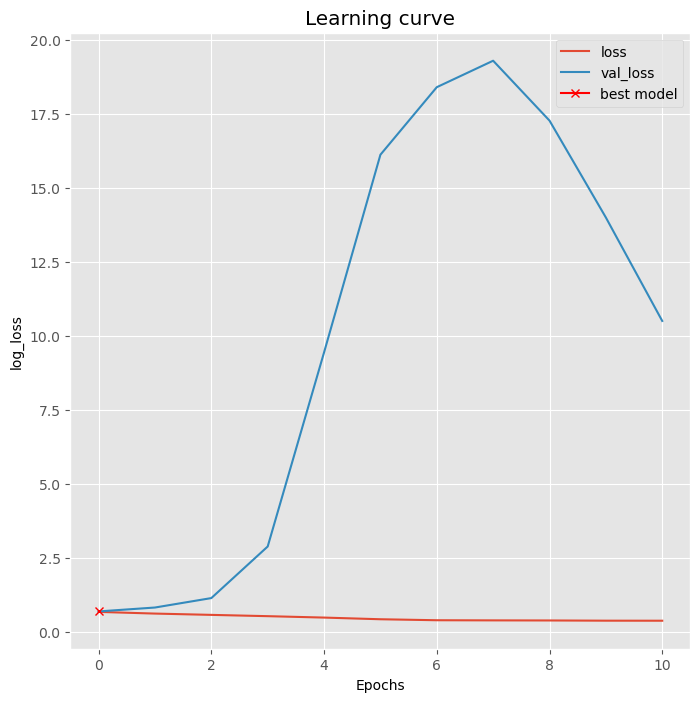

In [111]:
plt.figure(figsize=(8, 8))
plt.title("Learning curve")
plt.plot(results.history["loss"], label="loss")
plt.plot(results.history["val_loss"], label="val_loss")
plt.plot( np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("log_loss")
plt.legend();

#### # Plot Accuracy Vs Epoch curve for training and validation data

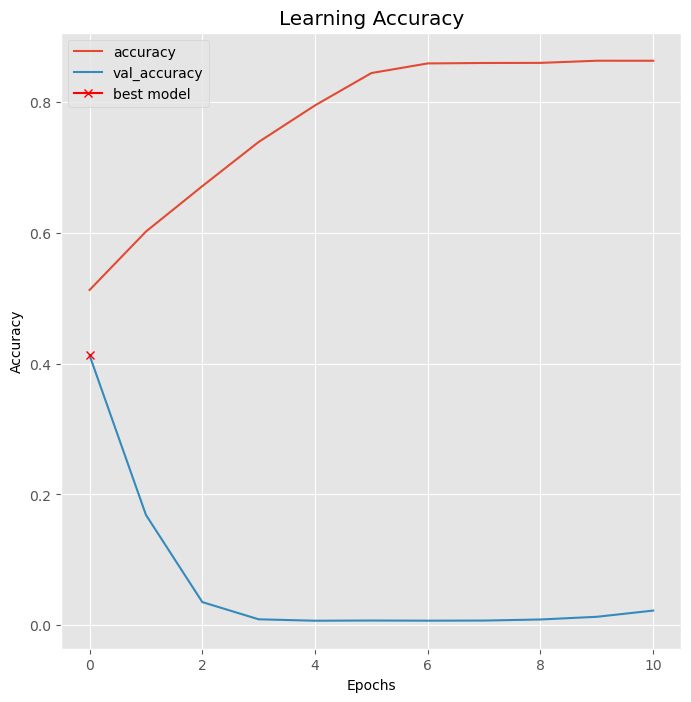

In [112]:
plt.figure(figsize=(8, 8))
plt.title("Learning Accuracy")
plt.plot(results.history["accuracy"], label="accuracy")
plt.plot(results.history["val_accuracy"], label="val_accuracy")
plt.plot( np.argmax(results.history["val_accuracy"]), np.max(results.history["val_accuracy"]), marker="x", color="r", label="best model")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend();

#### # Evaluate best model, make predictions at threshold = 0.5 and visulaize

In [113]:
# load the best model
model_3.load_weights('model_3-powerline.h5')
# Evaluate on validation set (this must be equals to the best log_loss)
model_3.evaluate(X_valid, y_valid, verbose=1)
# Predict on train, val and test
preds_train = model_3.predict(X_train, verbose=1)
preds_val = model_3.predict(X_valid, verbose=1)
# Threshold predictions
preds_train_t = (preds_train > 0.5).astype(np.uint8)
preds_val_t = (preds_val > 0.5).astype(np.uint8)

1/1 [==============================] - 0s 70ms/step


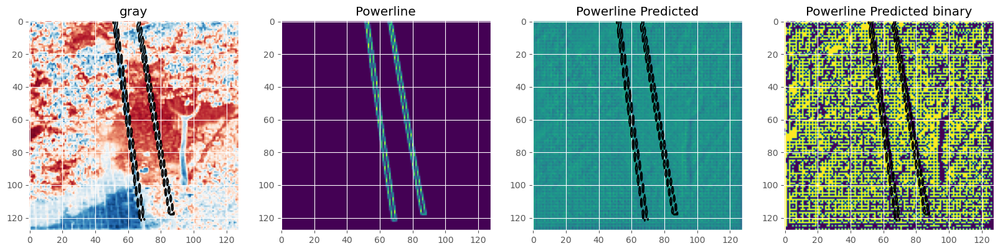

In [114]:
# Check if training data looks all right
plot_sample(X_train, y_train, preds_train, preds_train_t, ix=3)

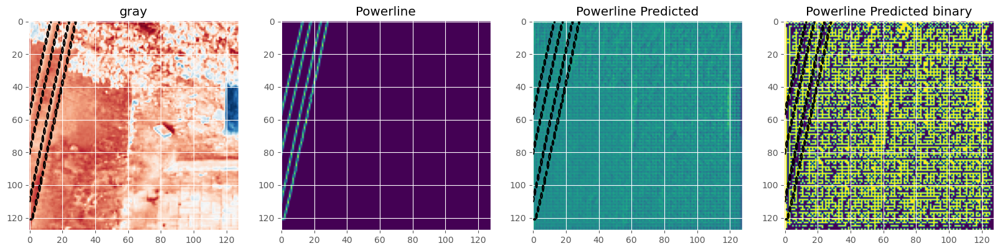

In [115]:
# Check if valid data looks all right
plot_sample(X_valid, y_valid, preds_val, preds_val_t, ix=1)

#### # Threshold predictions at 0.4 with visualization

In [116]:
# Threshold predictions
preds_train_t = (preds_train > 0.4).astype(np.uint8)
preds_val_t = (preds_val > 0.4).astype(np.uint8)

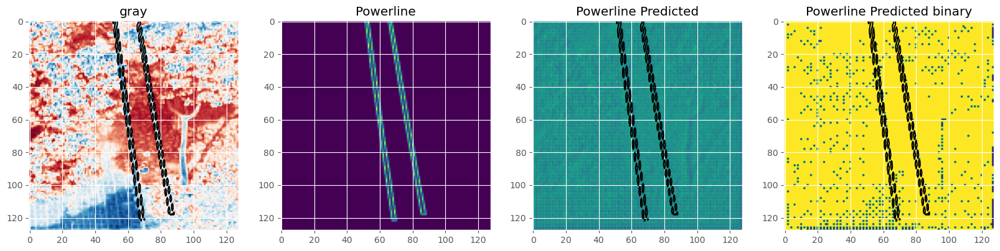

In [117]:
# Check if training data looks all right
plot_sample(X_train, y_train, preds_train, preds_train_t, ix=3)

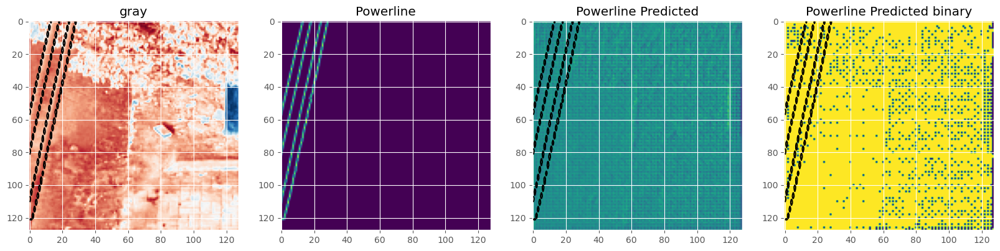

In [118]:
# Check if valid data looks all right
plot_sample(X_valid, y_valid, preds_val, preds_val_t, ix=1)

#### # Threshold predictions at 0.7 with visualization

In [119]:
# Threshold predictions
preds_train_t = (preds_train > 0.7).astype(np.uint8)
preds_val_t = (preds_val > 0.7).astype(np.uint8)

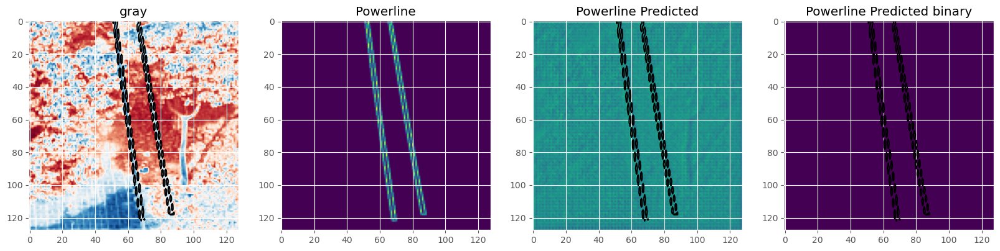

In [120]:
# Check if training data looks all right
plot_sample(X_train, y_train, preds_train, preds_train_t, ix=3)

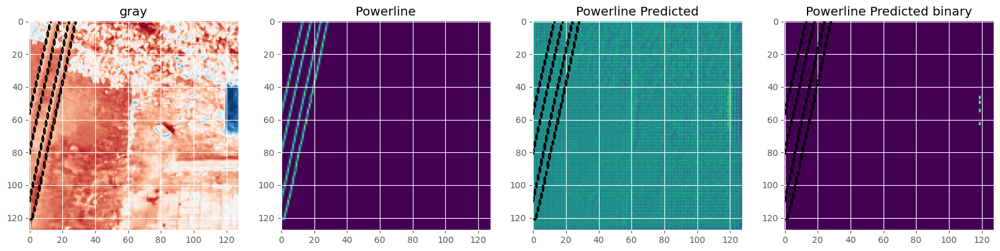

In [121]:
# Check if valid data looks all right
plot_sample(X_valid, y_valid, preds_val, preds_val_t, ix=1)

### 4. Train the model for 1000 epochs
This has already been carried out as part of the original model evaluation above.

# Observations

- Since we are training the models with only 30 images, clearly we notice that the number of images is not enough to come to any conclusion.
- It can be noted how the learning rate reduces and eventually early stopping is triggered in all the cases when a plateau is obtained in loss value.
- Choosing the right number of epochs, setting appropriate learning rate, choice of optimizer - they all impact the learning by the model.
- For each of the models tried, the loss and accuracy metrics for both the training and validation sets have been identified.